<a href="https://colab.research.google.com/github/joshua-y-hub/crisps/blob/main/Crisps_bulk.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [37]:
from google.colab import drive
import os

drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [38]:
!pip install tensorflow
import os
import glob
import cv2
import shutil
import numpy as np
import pandas as pd
import tensorflow as tf

TFLITE_MODEL_PATH = '/content/drive/MyDrive/Potato_slices/models/potato_model_dynamic_quant.tflite'
BULK_INPUT_DIR= '/content/drive/MyDrive/Potato_slices/unprocessed_bulk/bulk'
OUTPUT_DIR='/content/drive/MyDrive/Potato_slices/bulk_results'

In [39]:

#Initialize TFlite engine
interpreter =  tf.lite.Interpreter(model_path=TFLITE_MODEL_PATH)
interpreter.allocate_tensors()

/usr/local/lib/python3.13/dist-packages/tensorflow/lite/python/interpreter.py:457: UserWarning:     Warning: tf.lite.Interpreter is deprecated and is scheduled for deletion in
    TF 2.20. Please use the LiteRT interpreter from the ai_edge_litert package.
    See the [migration guide](https://ai.google.dev/edge/litert/migration)
    for details.
    
  warnings.warn(_INTERPRETER_DELETION_WARNING)


In [40]:
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()
height,width = input_details[0]['shape'][1],input_details[0]['shape'][2]


In [41]:

#create output sub directories for sorted images
healthy_out = os.path.join(OUTPUT_DIR,'sorted_healthy')
defected_out = os.path.join(OUTPUT_DIR,'sorted_defected')
os.makedirs(healthy_out,exist_ok=True)
os.makedirs(defected_out,exist_ok=True)

In [42]:
image_paths = glob.glob(os.path.join(BULK_INPUT_DIR, '*.[jJ][pP][gG]' )) + \
glob.glob(os.path.join(BULK_INPUT_DIR, '.[pP][nN][gG]'))

print(f"Found{len(image_paths)} images in '{BULK_INPUT_DIR}'.Starting bulk processing...\n")

Found460 images in '/content/drive/MyDrive/Potato_slices/unprocessed_bulk/bulk'.Starting bulk processing...



In [43]:
results_data = []
for path in image_paths:
    filename = os.path.basename(path)
    img_bgr = cv2.imread(path)

    if img_bgr is None:
        continue

    # Preprocess
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    img_resized = cv2.resize(img_rgb, (width, height))
    input_tensor = np.expand_dims(img_resized, axis=0).astype(np.float32)

    # Predict via TFLite
    interpreter.set_tensor(input_details[0]['index'], input_tensor)
    interpreter.invoke()
    score = float(interpreter.get_tensor(output_details[0]['index'])[0][0])

    label = "DEFECTED" if score >= 0.5 else "HEALTHY"
    confidence = score if label == "DEFECTED" else (1.0 - score)

    dest_dir = defected_out if label == "DEFECTED" else healthy_out
    shutil.copy(path,os.path.join(dest_dir,filename))

    results_data.append({
        'filename':filename,
        'prediction':label,
        'raw_score':round(score,4),
        'confidence_pct':round(confidence *100,2)
    })

In [44]:
#save summary report to CSV
df_results =pd.DataFrame(results_data)
csv_output_path = os.path.join(OUTPUT_DIR,'bulk_results.csv')
df_results.to_csv(csv_output_path,index=False)

In [45]:
print("="*60)
print("       BULK PROCESSING COMPLETE       ")
print("="*60)
print(f"Total images processed: {len(df_results)}")
print(f"Defected slices found:{len(df_results[df_results['prediction']== 'DEFECTED'])}")
print(f"Healthy slices found:{len(df_results[df_results['prediction']== 'HEALTHY'])}")
print(f"CSV summary saved to:{csv_output_path}")
print(f"sorted images directory:{OUTPUT_DIR}")
print("="*60)

       BULK PROCESSING COMPLETE       
Total images processed: 460
Defected slices found:142
Healthy slices found:318
CSV summary saved to:/content/drive/MyDrive/Potato_slices/bulk_results/bulk_results.csv
sorted images directory:/content/drive/MyDrive/Potato_slices/bulk_results


Total entries in CSV: 460
Found 142 DEFECTED slices in CSV record.



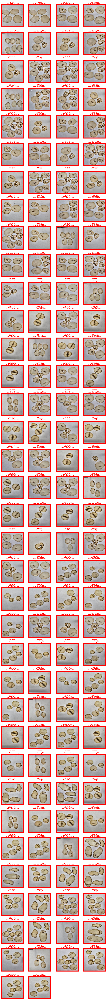

In [46]:
import os
import cv2
import math
import pandas as pd
import matplotlib.pyplot as plt

# ---------------------------------------------------------
# 1. SETUP PATHS TO YOUR CSV AND ORIGINAL INPUT DIRECTORY
# ---------------------------------------------------------
# Path to the CSV file containing the batch predictions
CSV_SUMMARY_PATH = '/content/drive/MyDrive/Potato_slices/bulk_results/bulk_results.csv'

# Path to the original directory where the uninspected/input images live
BULK_INPUT_DIR= '/content/drive/MyDrive/Potato_slices/unprocessed_bulk/bulk'

# ---------------------------------------------------------
# 2. READ CSV AND FILTER DEFECTED SLICES
# ---------------------------------------------------------
# Read the predictions dataframe from CSV
df = pd.read_csv(CSV_SUMMARY_PATH)

# Filter out only rows where the prediction is 'DEFECTED'
df_defected = df[df['prediction'] == 'DEFECTED'].copy()

total_defects = len(df_defected)
print(f"Total entries in CSV: {len(df)}")
print(f"Found {total_defects} DEFECTED slices in CSV record.\n")

# ---------------------------------------------------------
# 3. LOAD IMAGES FROM INPUT DIR AND DISPLAY IN GRID
# ---------------------------------------------------------
if total_defects == 0:
    print("No defected slices recorded in the CSV file!")
else:
    COLS = 4  # Number of images per row
    ROWS = math.ceil(total_defects / COLS)

    plt.figure(figsize=(16, 4 * ROWS))

    for idx, (_, row) in enumerate(df_defected.iterrows()):
        filename = row['filename']

        # Construct the direct path to the original input image using the filename in CSV
        image_path = os.path.join(BULK_INPUT_DIR, filename)

        # Read image from input directory
        img_bgr = cv2.imread(image_path)

        if img_bgr is None:
            print(f"Warning: Could not load image {filename} from {BULK_INPUT_DIR}")
            continue

        # Convert OpenCV BGR channel format to RGB for display
        img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

        # Add a visual red border around the array
        BORDER_SIZE = 12
        img_bordered = cv2.copyMakeBorder(
            img_rgb,
            BORDER_SIZE, BORDER_SIZE, BORDER_SIZE, BORDER_SIZE,
            cv2.BORDER_CONSTANT,
            value=[255, 0, 0]  # Red border
        )

        # Extract prediction metrics recorded in the CSV row
        score = row['raw_score']
        confidence = row['confidence_pct']

        # Render image inside grid subplot
        plt.subplot(ROWS, COLS, idx + 1)
        plt.imshow(img_bordered)
        plt.title(
            f"DEFECTED\n{filename}\nScore: {score:.4f} ({confidence}%)",
            color='red',
            fontsize=10,
            fontweight='bold'
        )
        plt.axis('off')

    plt.tight_layout()
    plt.show()